# Exploratory Data Analysis

This version manually go through index with 'None', goes through investigation report to identify primary cause and add the primary cause code. There are 33% of the investigation reports with primary cause but without cause code.

## 1.0 Table of Content
* [1.0 Revisions](#revisions)
* [2.0 Descriptive Analysis](#descriptive)
* [3.0 Data Preprocessing](#preprocess)
    * [3.1 Processing to extract predictor labels](#predictor)
* [4.0 Exploratory Analysis](#explore)
    * [4.1 Document Word Count](#docwordcount)
    * [4.2 Readability](#readability)
    * [4.3 Word Count](#wordcount)
    * [4.4 Ngrams](#ngrams)
    * [4.5 Topic Modelling (LDA)](#lda)
    * [4.6 Wordcloud](#wordcloud)
    * [4.7 Sentiment Analysis](#sentiment)
    * [4.8 Named Entity Recognition](#ner)
    * [4.9 PoS Tagging](#pos)


Author:
Shien Long


## 2.0 Descriptive Analysis <a class="anchor" id="descriptive"></a>

In [1]:
import os
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import collections
import seaborn as sns
import string
import re
import time

In [2]:
from warnings import filterwarnings

filterwarnings("ignore", ".*`should_run_async`.*")

In [3]:
print(os.getcwd())

C:\GitCloneDir\Final_Project


In [4]:
datapath = os.getcwd() + '\data\\text'
listfilename = os.listdir(datapath)

In [5]:
listfilename

['2015_10_09_Mount_Carbon_Findings_Report_FINAL.txt',
 '2015_11_04_Mount_Carbon_TECHNICAL_Report.txt',
 'Cayce SC (HQ-2018-1250) Final.txt',
 'HQ-1253 - PA.txt',
 'HQ-2009-29.txt',
 'HQ-2009-30.txt',
 'HQ-2009-31.txt',
 'HQ-2010-11.txt',
 'HQ-2010-60.txt',
 'HQ-2011-30.txt',
 'HQ-2011-34.txt',
 'HQ-2011-38.txt',
 'HQ-2011-56.txt',
 'HQ-2012-05.txt',
 'HQ-2012-21.txt',
 'HQ-2012-22.txt',
 'HQ-2012-33.txt',
 'HQ-2012-36.txt',
 'HQ-2012-41.txt',
 'HQ-2013-01 Final with Cover Page.txt',
 'HQ-2013-02 Final with Cover Page (2).txt',
 'HQ-2013-03 Final with Cover Page.txt',
 'HQ-2013-05 Final.txt',
 'HQ-2013-07 Final with Cover Page.txt',
 'HQ-2013-08 Final.txt',
 'HQ-2013-09 Final with Cover Page.txt',
 'HQ-2013-10 Final with Cover Page.txt',
 'HQ-2013-1050 Final.txt',
 'HQ-2013-11 Final Report.txt',
 'HQ-2013-12 Final with Cover Page.txt',
 'HQ-2013-13 Final with Cover Page.txt',
 'HQ-2013-14 Final with Cover Page.txt',
 'HQ-2013-15 Final with Cover Page.txt',
 'HQ-2013-16 Final with Cover 

In [6]:
data = []
for f in listfilename:
    g = datapath+'\\'+f
    with open(g, "r", encoding='utf-8') as myfile:
        data.append(myfile.read())
        
df = pd.DataFrame(data)

In [7]:
df.head()

,0
0,FEDERAL RAILROAD ADMINISTRATION ...
1,FEDERAL RAILROAD ADMINISTRATION ...
2,\n\nU.S. Department of \nTransportation \n ...
3,Federal Railroad Administration \nOffice of Ra...
4,\n\nFederal Railroad Administration \nOffice ...


1 column with each row containing text associated with investigation report.

In [8]:
seriesfile = pd.Series(listfilename)
df['report'] = seriesfile

In [9]:
df.head()

,0,report
0,FEDERAL RAILROAD ADMINISTRATION ...,2015_10_09_Mount_Carbon_Findings_Report_FINAL.txt
1,FEDERAL RAILROAD ADMINISTRATION ...,2015_11_04_Mount_Carbon_TECHNICAL_Report.txt
2,\n\nU.S. Department of \nTransportation \n ...,Cayce SC (HQ-2018-1250) Final.txt
3,Federal Railroad Administration \nOffice of Ra...,HQ-1253 - PA.txt
4,\n\nFederal Railroad Administration \nOffice ...,HQ-2009-29.txt


Added the filename into a column for reference or any verification needed. 

In [10]:
df.shape

(598, 2)

Dataframe contains 598 attributes, corresponding to 598 investigation reports. 

In [11]:
df.describe()

,0,report
count,598,598
unique,596,598
top,\n \n \n \n \n \n \n \n\n \n\nFederal Railroa...,hq200803.txt
freq,2,1


In [12]:
# code path
codepath = os.getcwd() + '\data\\codes'
listfilename = os.listdir(codepath)

Primary failure cause codes will be verified against a code list.

## 3.0 Data Preprocessing <a class="anchor" id="preprocess"></a>

### 3.1 Processing to extract predictor labels <a class="anchor" id="predictor"></a>

Investigation report contains cause codes used to identify accident cause categories. The cause code is a set of 4 alphanumeric charcters. The first character is alphabetical, 2nd and 3rd character is numerical, the last character is alphanumeric. 

Given that the data is unstructured, there are instances where the codes are written in a non standard manner or noise where it looks like code but are not failure codes described by FRA.

Examples:
- Characters available in failure codes.
    - M307
    - E51C
- Non-standard way of writing codes (hyphens).
    - M-307
    - E-51C
- Whitespace after codes in code listing
    - M307\n


The focus is to extract the primary cause codes to be used as labels. Therefore a search and filter is used to search for keyword "Primary Cause Code" to identify which codes are the primary cause. 

In [13]:
# read failure cause code list into dataframe
codedf = pd.read_excel(codepath + '\\' + listfilename[0])
codedf.head()

,Code,Description,Category,Title
0,E51C,Broken or bent axle between wheel seats,Axles and Journal Bearings,Mechanical and Electrical Failures
1,E51L,Broken or bent axle between wheel seats (LOCOM...,Axles and Journal Bearings,Mechanical and Electrical Failures
2,E52C,Journal (plain) failure from overheating,Axles and Journal Bearings,Mechanical and Electrical Failures
3,E52L,Journal (plain) failure from overheating (LOCO...,Axles and Journal Bearings,Mechanical and Electrical Failures
4,E53C,Journal (roller bearing) failure from overheat...,Axles and Journal Bearings,Mechanical and Electrical Failures


Check 'Code' column text length. This is done since will be using it as reference to verify if filtered 'codes' are valid, therefore the length will need to match.

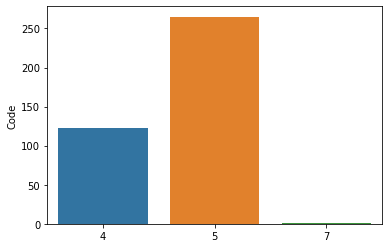

In [14]:
ax = sns.barplot(x=codedf.Code.map(lambda x: len(x)).value_counts().index, y=codedf.Code.map(lambda x: len(x)).value_counts())
# codedf['Code'].map(lambda x: len(x)).value_counts()

A length of '4' is expected but is observed that most codes have length of 5. A check is done to see why is that. 

In [15]:
codedf.Code.iloc[0]

'E51C '

A quick check observes that the additional character is a blank space. All blank space shall be removed. 

In [16]:
# Remove whitespace from codes in 'Code' column
codedf['Code']=codedf['Code'].str.replace(' ', '')
codedf['Code'].map(lambda x: len(x)).value_counts()

4    389
Name: Code, dtype: int64

This confirms that all 389 Codes are of length 4.

In [17]:
# remove hyphens, help with regex extraction of primary cause code, some codes have hyphen between alphabets and numerals.
df[0] = df[0].map(lambda x: re.sub('-','',x))

Hyphens are removed here and not in clean text, because during EDA found that some reports uses hyphens. At this stage we perform preprocessing to allow search and filtering of primary cause codes. The numerical values from codes will be removed during text cleaning portion of preprocessing. 

In [18]:
# store codes into list
fra_codes = codedf['Code'].values.tolist()

In [19]:
# function to search and filter primary cause code.

def search_filter_re(text, codesdf):
    # create RE pattern
    search_pattern = r'(?<=Primary Cause)\W+\w+\W+\w\d{2}\w'  # search for text "Primary Cause", should yield "Code" with alphanumeric cause code
    filter_pattern = r'\b[EHMST]\d{2}\w\b'   # filter eg: Code M307 will produce "M307"
    
    # create object from pattern
    search_obj = re.compile(search_pattern)
    filter_obj = re.compile(filter_pattern)
    
    # empty list
    emptylist = []
    
    # search and filter
    search_txt = search_obj.findall(text)
    if (search_txt != emptylist):
        filter_txt = filter_obj.findall(search_txt[0])
    
        # temp list
        temp_list = []
    
        # check code against code list, only store codes that are in code list
        for ea in codesdf['Code']:
            if ea in filter_txt:
                if ea not in temp_list:
                    temp_list.append(ea)
    
        # return primary cause code
        return temp_list


In [20]:
df['codes'] = df[0].map(lambda x: search_filter_re(x, codedf))
df['codes'] = df['codes'].replace([None], 'NoCode')
df['codes'].astype(str)

0      ['T308']
1      ['T308']
2      ['H799']
3      ['T002']
4      ['T109']
         ...   
593    ['T215']
594    ['T399']
595    ['M405']
596    ['T002']
597    ['M307']
Name: codes, Length: 598, dtype: object

Codes are searched and filtered from investigation reports. Investigation reports without codes are automatically labelled 'None' and is renamed to 'NoCode'. 

Investigation report without cause codes or 'None' shall be removed from dataset since it is not suitable to classify if it does not have cause codes. 

In [21]:
nocodeindex = df.index[df['codes'] == 'NoCode']
list(nocodeindex)

[174, 175, 176, 231, 235, 241, 254, 255, 256, 257, 263, 264, 270]

In [22]:
df.drop(nocodeindex, inplace=True)

In [23]:
df[df['codes']=='NoCode']

,0,report,codes


In [24]:
df.shape

(585, 3)

In [25]:
# function to extract first alphabet character from codes. The first alphabet indicates the main category, ie: 'T' - track, 'H' - human error,
# etc. This helps to filter the categories to 5 categories. Otherwise will not be able to perform meaningful classification with 389 sub-
# categorical codes. 

def main_cat(subcode):
    pattern = r'[EHMST]'
    obj = re.compile(pattern)
    
    empty_list = []
    
    for ea in subcode:      
        subtext = obj.findall(ea)
        print(subtext)
        if subtext != empty_list:
            return subtext[0]    


In [26]:
df['maincode'] = df['codes'].map(lambda x: main_cat(x))
df['maincode']

['T']
['T']
['H']
['T']
['T']
['H']
['H']
['H']
['T']
['T']
['H']
['M']
['M']
['M']
['T']
['T']
['T']
['M']
['T']
['M']
['T']
['H']
['E']
['H']
['H']
['M']
['M']
['T']
['T']
['H']
['H']
['M']
['T']
['H']
['H']
['T']
['E']
['H']
['T']
['M']
['H']
['M']
['T']
['H']
['H']
['E']
['H']
['E']
['E']
['E']
['H']
['H']
['H']
['T']
['M']
['H']
['H']
['M']
['H']
['H']
['M']
['H']
['H']
['H']
['T']
['M']
['T']
['T']
['H']
['H']
['T']
['H']
['M']
['M']
['M']
['T']
['E']
['T']
['E']
['M']
['E']
['M']
['H']
['E']
['T']
['H']
['E']
['H']
['M']
['H']
['T']
['H']
['H']
['H']
['T']
['T']
['H']
['T']
['M']
['M']
['H']
['T']
['M']
['M']
['H']
['M']
['M']
['E']
['M']
['M']
['T']
['T']
['M']
['H']
['T']
['M']
['M']
['M']
['M']
['M']
['H']
['H']
['H']
['H']
['T']
['M']
['M']
['T']
['H']
['H']
['H']
['H']
['H']
['M']
['H']
['E']
['T']
['H']
['H']
['H']
['H']
['H']
['T']
['H']
['M']
['H']
['H']
['E']
['T']
['T']
['H']
['M']
['T']
['M']
['H']
['M']
['H']
['M']
['T']
['E']
['M']
['E']
['E']
['T']
['M']
['E']
['E'

0      T
1      T
2      H
3      T
4      T
      ..
593    T
594    T
595    M
596    T
597    M
Name: maincode, Length: 585, dtype: object

The main category is extracted from the failure code. 

In [27]:
# function to remove stopwords

def rem_sw(text, stopword):
    text_nosw = [wrd for wrd in text.split() if not wrd in stopword]
    return' '.join(text_nosw)  # return as list

In [28]:
special_char = ['\n', 'br', ':', ';', '#', '*', 'na', 'N/A', 'NA', 'n/a']
sw = set(stopwords.words('english'))

# function to clean text - remove punctuation, change to lower case, remove numerical values, remove special characters and unicode characters. 

def clean_text(text, sw):
    text = text.translate(str.maketrans('','', string.punctuation))  # remove punctuation
    
    for i in special_char:
        text = text.replace(i,'') # remove special char
        
    text = text.lower() # change all uppercase to lowercase
    
    #number_pattern = r'\d+'  #previous pattern
    number_pattern = r'[0-9]'    
    text = re.sub(pattern=number_pattern, repl="", string=text) # remove numbers
    
    punctuation = r'[^\w\s]'
    text=re.sub(pattern=punctuation, repl="", string=text) # remove punctuation
    
    text_encode = text.encode("ascii", "ignore")  # remove unicode characters
    text = text_encode.decode() 
    
    text = rem_sw(text, sw)
    
    return text

In [29]:
%%time
df['text_clean'] = df[0].map(lambda x: clean_text(x, sw))
df['text_clean'].head()

Wall time: 2.95 s


0    federal railroad administration new jersey ave...
1    federal railroad administration new jersey ave...
2    us department transportation federal railroad ...
3    federal railroad administration office railroa...
4    federal railroad administration office safety ...
Name: text_clean, dtype: object

In [30]:
df['text_clean'] = df['text_clean'].map(lambda x: re.sub('transportationfederal', 'transportation federal', x))
df['text_clean'] = df['text_clean'].map(lambda x: re.sub('reportfra', 'report fra', x))

Additional cleaning by separating joint words that could be due to typing error. 

ie: 'transportationfederal'

## 4.0 Exploratory Analysis <a class="anchor" id="explore"></a>
### 4.1 Document Word Count <a class="anchor" id="docwordcount"></a>

<AxesSubplot:>

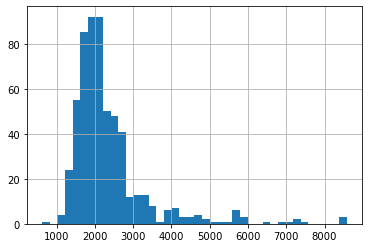

In [31]:
# number of words found in each investigation report plot via histogram

df['text_clean'].str.split().\
map(lambda x: len(x)).\
hist(bins=40)

skewed to left. Long tail to right. Not normal distribution. Majority around 2000 words. 

In [32]:
# plot boxplot of number of words found in each investigation report

df['wrdcnt'] = df['text_clean'].str.split().map(lambda x: len(x))

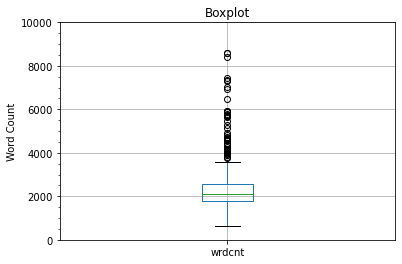

In [33]:

ax = df.boxplot(column='wrdcnt')
ax.set(ylabel="Word Count", ylim=(0, 10000), title="Boxplot")
ax.minorticks_on()

- Range of words start from 0 to 10000 words. 
- Several reports have very little words below minimum line.
- 50% of reports have total words around 2000 words.
- There is a long tail of outliers.

In [34]:
df['text_clean'].iloc[243]

'federal railroad administration office safety headquarters assigned accident investigation report hq union pacific thrall texas august note usc provides part accident incident report made secretary transportation federal railroad administration usc may used civil action damages resulting matter mentioned report department transportation federal railroad administration fra factual railroad accident report fra file hqsasadescribe rrative divisionname railroad operating train union pacific rr co name railroad operating train union pacific rr co us dotaar grade crossing identification numbera alphabetic codeb railroad accidentincident noa alphabetic codeb railroad accidentincident upupname railroad responsible track maintencea alphabetic codeb railroad accidentincident date accidentincident time accidentincidentmonthdayyear otherampm type accidentindicent derailmentsingle entry code box head collision side collision raking collision broken train collision hwyrail crossing rr grade crossin

- the long tail contains word counts that are up to possibly 10000 words. 
- lets take a look at the top 5 word counts and explore what the report contains. 

In [35]:
df[df['wrdcnt']>8000].wrdcnt

1      8396
180    8575
181    8575
Name: wrdcnt, dtype: int64

- 2 indexes with same word count. Lets have a look to see what do they contain. 

In [36]:
df['text_clean'].iloc[180]

'federal railroad administration office safety headquarters assigned accident investigation report hq burlington northern santa fe bnsf temple texas january note usc provides part accident incident report made secretary transportation federal railroad administration usc may used civil action damages resulting matter mentioned report department transportation federal railroad administration name railroad operating train burlington northern santa fe corporationname railroad operating train burlington northern santa fe corporationname railroad responsible track maintencebnsf rwy co bnsf us dotaar grade crossing identification numberfra factual railroad accident report fra file hqa alphabetic codebnsfa alphabetic codebnsfa alphabetic codebnsfb railroad accidentincident nob railroad accidentincident b railroad accidentincident nogcgcgc date accidentincident time accidentincidentmonthdayyear type accidentindicent derailmentsingle entry code box head collision side collision raking collision 

- looks like genuine text. 

In [37]:
df['maincode'].value_counts()

H    219
T    150
M    148
E     64
S      3
Name: maincode, dtype: int64

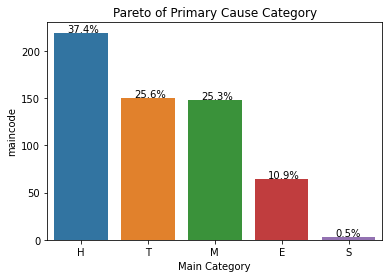

In [38]:
ax = sns.barplot(x=df.maincode.value_counts().index, y=df.maincode.value_counts())
plt.title('Pareto of Primary Cause Category')
plt.xlabel('Main Category')

total = len(df['maincode'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() - 0.6
        y = p.get_y() + p.get_height() + 1
        ax.annotate(percentage, (x, y))

plt.show()

Human caused error contributes 37.4% of primary cause. It is also the highest cause category. 

Track and Miscellaneous cause categories comprise the 2nd and 3rd highest, both approximately the same percentage at 25%. 

Mechanical and electrical cause denoted by alphabet 'E' cause approximately 10.9% of accidents. 

Signals and communication causation is approximately 0.5%. 

(Against total of 585 investigation report)

In [39]:
total = len(df['maincode'])
total

585

### 4.2 Readability <a class="anchor" id="readability"></a>

The average word length (AWL) and average sentence length (ASL) is obtained to get an idea of the readability (using Flesch formula) of the investigation reports. 

<AxesSubplot:>

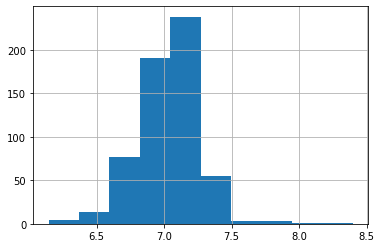

In [40]:
# average word length in each investigative report
# average length of each word. ie: avg number of letters

df['text_clean'].str.split().\
apply(lambda x: [len(i) for i in x]).\
map(lambda x: np.mean(x)).hist()

In [41]:
df['avgwrdlen'] = df['text_clean'].str.split().\
apply(lambda x: [len(i) for i in x]).\
map(lambda x: np.mean(x))


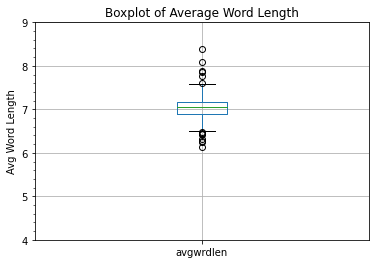

In [42]:

ax1 = df.boxplot(column='avgwrdlen')
ax1.set(ylabel="Avg Word Length", ylim=(4, 9), title="Boxplot of Average Word Length")
ax1.minorticks_on()

- 50% of words are around 7 letters long. 

In [43]:
import spacy
from spacy_readability import Readability
import en_core_web_sm

nlp = spacy.load('en_core_web_sm')
nlp.add_pipe(Readability())

doc = nlp("I am some really difficult text to read because I use obnoxiously large words.")
print(doc._.flesch_kincaid_grade_level)
print(doc._.flesch_kincaid_reading_ease)
print(doc._.dale_chall)
print(doc._.automated_readability_index)

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\spacy\util.py:275: UserWarning: [W031] Model 'en_core_web_sm' (2.2.0) requires spaCy v2.2 and is incompatible with the current spaCy version (2.3.5). This may lead to unexpected results or runtime errors. To resolve this, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


8.412857142857145
59.68214285714288
7.714471428571429
7.1014285714285705


#### readability formula

- Flesch - grade level: 8, reading ease: 59
- Dale-Chall - grade level: 9-10
- ARI - grade level: 7

Readability formulas generated different grade reading levels. Range 7 to 10. 

### 4.3 Word Count <a class="anchor" id="wordcount"></a>

In [44]:
# create corpus
corpus=[]
new=df['text_clean'].str.split()
new=new.values.tolist()
corpus=[word for i in new for word in i]

<AxesSubplot:>

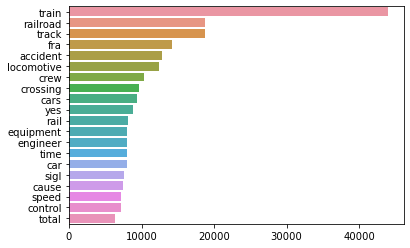

In [45]:
# Count & store occurrences of each word in a list of tuples -> word-level analysis

from collections import Counter

counter=Counter(corpus)
most=counter.most_common()

x,y=[],[]
for word,count in most[:20]:
    if (word not in sw):
        x.append(word)
        y.append(count)
        
sns.barplot(x=y, y=x)

- Train - more than 40k occurences. 
- Railroad & track similar occurences, approximately 20k each. 

### 4.4 Ngrams <a class="anchor" id="ngrams"></a>

In [46]:
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer

def plot_top_ngrams_barchart(text, n=2):
    stop = set(stopwords.words('english'))
    
    new=text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]
    
    def get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0)
        words_freq = [(word, sum_words[0, idx])
                     for word, idx in vec.vocabulary_.items()]
        words_freq = sorted(words_freq, key = lambda x:x[1], reverse=True)
        return words_freq[:10]
    
    top_n_bigrams=get_top_ngram(text,n)[:10]
    x,y=map(list,zip(*top_n_bigrams))
    sns.barplot(x=y,y=x)

In [47]:
new=df['text_clean'].str.split()

In [48]:
new.head()

0    [federal, railroad, administration, new, jerse...
1    [federal, railroad, administration, new, jerse...
2    [us, department, transportation, federal, rail...
3    [federal, railroad, administration, office, ra...
4    [federal, railroad, administration, office, sa...
Name: text_clean, dtype: object

In [49]:
new=new.values.tolist()

In [50]:
corpus=[word for i in new for word in i]

In [51]:
corpus[15001]

'equipment'

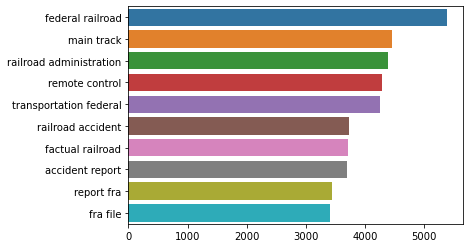

In [52]:

plot_top_ngrams_barchart(df['text_clean'], 2)

2nd highest bigram count is 'main track' - maybe significant.

Wall time: 6.98 s


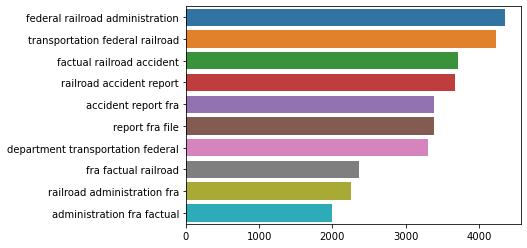

In [53]:
%%time
plot_top_ngrams_barchart(df['text_clean'], 3)

The only tri-gram phrase that does not seem generic are:
- 'remote control portable'

In [54]:
# change 'None' to something else
# df['codes'].replace(['None'],'code0', inplace=True)
# df['maincode'].replace(['None'],'code0', inplace=True)

# change values in 'codes' column to type string
df['codes'] = df['codes'].astype(str)
df['maincode'] = df['maincode'].astype(str)

# change column values to list
#y_list = df['codes'].tolist()
y_list = df['maincode'].tolist()

In [55]:
# import model, vector conversion and metric tools
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix

def get_metrics(y_test, y_predicted):  
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, pos_label=None,
                                    average='weighted')             
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, pos_label=None,
                              average='weighted')
    
    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, pos_label=None, average='weighted')
    
    # true positives + true negatives/ total
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1

In [56]:
# Function to plot confusion matrix and prints recall scores

def cm_func(desc, Ytest, pred):
    print('Recall score: {0:0.2f}'.format(recall_score(Ytest, pred, pos_label=None,
                              average='weighted')))
    labels = ['H','T','M','E','S']
    cm = confusion_matrix(Ytest, pred, labels=labels)
#     class_label = ["H", "T"]
    #df_cm = pd.DataFrame(cm, index=class_label,columns=class_label)
    f,ax = plt.subplots(figsize=(9, 6))
    sns.heatmap(cm, annot=True,fmt='d')
    plt.title("Confusion Matrix: " + desc)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

In [57]:
# split test and training data
# 70% training, 30% test
x_list = df['text_clean'].tolist()

# X_train, X_test, y_train, y_test = train_test_split(df['rem_uni'], y_list, test_size=0.3)
X_train, X_test, y_train, y_test = train_test_split(x_list, y_list, test_size=0.3)

In [58]:
# TF-IDF method
def tf_idf_vectorize(data):
    tfidf_vectorize = TfidfVectorizer()
    tf_data = tfidf_vectorize.fit_transform(data)
    
    return tf_data, tfidf_vectorize

In [59]:
# BoW method
def count_vectorize(data):
    count_vectorizor = CountVectorizer()
    cv_data = count_vectorizor.fit_transform(data)
    
    return cv_data, count_vectorizor

TF only

In [60]:
X_train_counts, count_vectorizor = count_vectorize(X_train)
X_test_counts = count_vectorizor.transform(X_test)

clf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg', 
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.824, precision = 0.824, recall = 0.824, f1 = 0.823


Recall score: 0.82


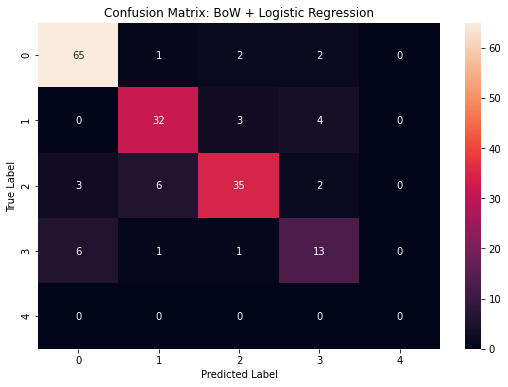

In [61]:
cm_func('BoW + Logistic Regression',y_test, y_predicted_counts)

TFIDF only

In [62]:
X_train_tf, tfidf_vector = tf_idf_vectorize(X_train)
X_test_tf = tfidf_vector.transform(X_test)

clf.fit(X_train_tf, y_train)
y_predict_tf = clf.predict(X_test_tf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_tf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.835, precision = 0.846, recall = 0.835, f1 = 0.833


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Recall score: 0.84


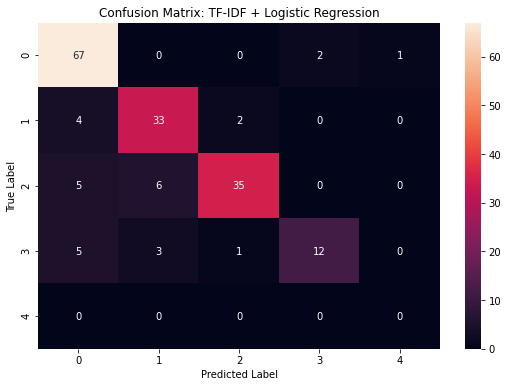

In [63]:
cm_func('TF-IDF + Logistic Regression',y_test, y_predict_tf)

Bigram + TF-IDF

In [64]:
tfidfvec = TfidfVectorizer(ngram_range=(2,2))

X_train_tfidf = tfidfvec.fit_transform(X_train)
X_test_tfidf = tfidfvec.transform(X_test)

clf.fit(X_train_tfidf, y_train)
y_predict_bitf = clf.predict(X_test_tfidf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_bitf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.784, precision = 0.838, recall = 0.784, f1 = 0.754


Recall score: 0.78


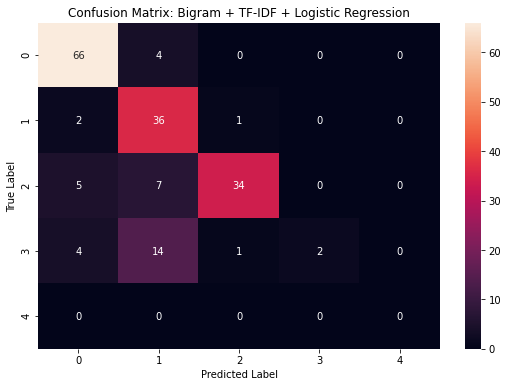

In [65]:
cm_func('Bigram + TF-IDF + Logistic Regression',y_test, y_predict_bitf)

Bigram + TF

In [66]:
cvec = CountVectorizer(ngram_range=(2,2))
X_train_count = cvec.fit_transform(X_train)
X_test_count = cvec.transform(X_test)

clf.fit(X_train_count, y_train)
y_predict_count = clf.predict(X_test_count)

accuracy_count, precision_count, recall_count, f1_count = get_metrics(y_test, y_predict_count)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_count, precision_count, 
                                                                       recall_count, f1_count))

accuracy = 0.812, precision = 0.819, recall = 0.812, f1 = 0.803


Recall score: 0.81


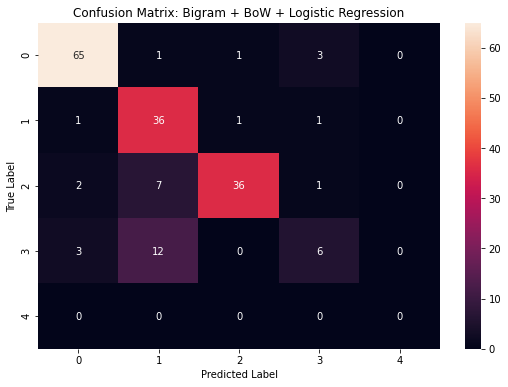

In [67]:
cm_func('Bigram + BoW + Logistic Regression',y_test, y_predict_count)

Trigram + TF-IDF

In [68]:
tritfidfvec = TfidfVectorizer(ngram_range=(3,3))

X_train_tritfidf = tritfidfvec.fit_transform(X_train)
X_test_tritfidf = tritfidfvec.transform(X_test)

#LogisticRegression called earlier for bigram
clf.fit(X_train_tritfidf, y_train)
y_predict_tritfidf = clf.predict(X_test_tritfidf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_tritfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.716, precision = 0.727, recall = 0.716, f1 = 0.690


Recall score: 0.72


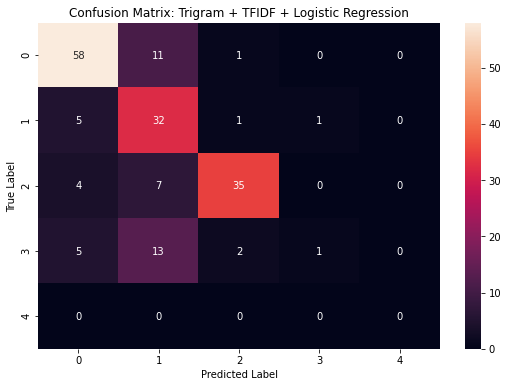

In [69]:
cm_func('Trigram + TFIDF + Logistic Regression',y_test, y_predict_tritfidf)

Trigram + TF

In [70]:
cvec = CountVectorizer(ngram_range=(3,3))
X_train_count = cvec.fit_transform(X_train)
X_test_count = cvec.transform(X_test)

clf.fit(X_train_count, y_train)
y_predict_tricount = clf.predict(X_test_count)
accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_tricount)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.756, precision = 0.768, recall = 0.756, f1 = 0.733


Recall score: 0.76


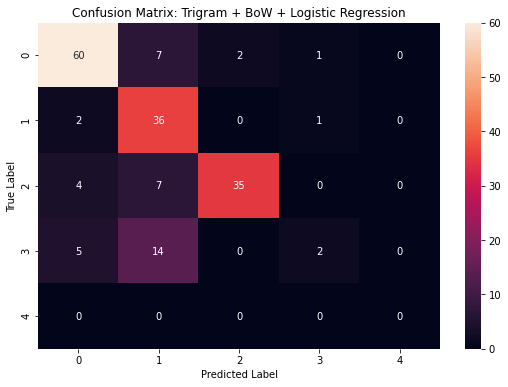

In [71]:
cm_func('Trigram + BoW + Logistic Regression',y_test, y_predict_tricount)

SVM + Tfidf, Bigram + Tfidf + SVM, Trigram + Tfidf + SVM

SVM + Count, Bigram + Count + SVM, Trigram + Count + SVM

In [72]:
svmvec = TfidfVectorizer()
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm = svm.SVC()
clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.801, precision = 0.841, recall = 0.801, f1 = 0.772


Recall score: 0.80


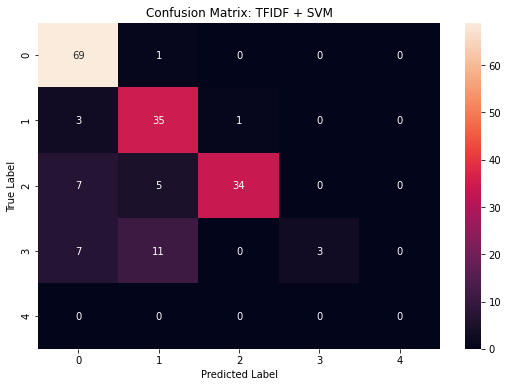

In [73]:
cm_func('TFIDF + SVM',y_test, y_predict_svm)

In [74]:
svmvec = CountVectorizer()
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm = svm.SVC()
clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.750, precision = 0.702, recall = 0.750, f1 = 0.707


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Recall score: 0.75


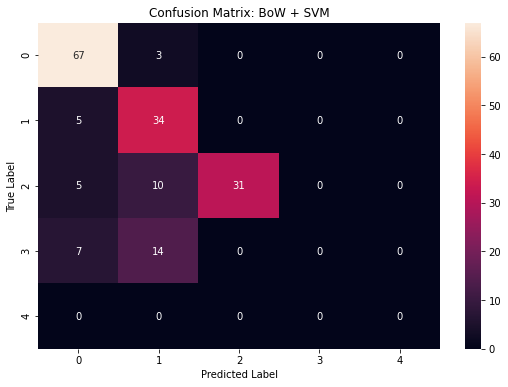

In [75]:
cm_func('BoW + SVM',y_test, y_predict_svm)

In [76]:
svmvec = TfidfVectorizer(ngram_range=(2,2))
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.716, precision = 0.662, recall = 0.716, f1 = 0.673


Recall score: 0.72


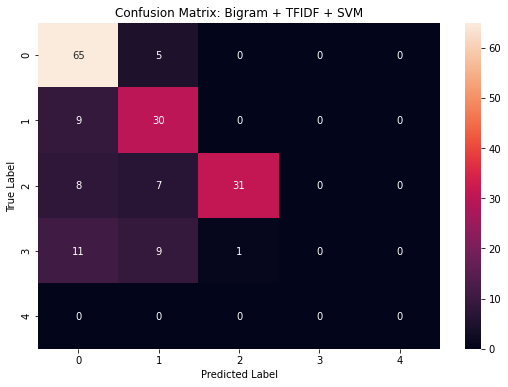

In [77]:
cm_func('Bigram + TFIDF + SVM',y_test, y_predict_svm)

In [78]:
svmvec = CountVectorizer(ngram_range=(2,2))
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.727, precision = 0.711, recall = 0.727, f1 = 0.696


Recall score: 0.73


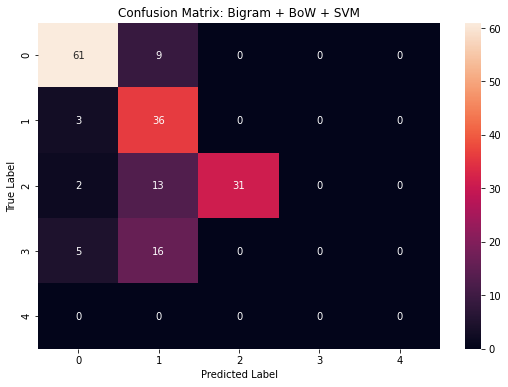

In [79]:
cm_func('Bigram + BoW + SVM',y_test, y_predict_svm)

In [80]:
svmvec = TfidfVectorizer(ngram_range=(3,3))
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.619, precision = 0.600, recall = 0.619, f1 = 0.591


Recall score: 0.62


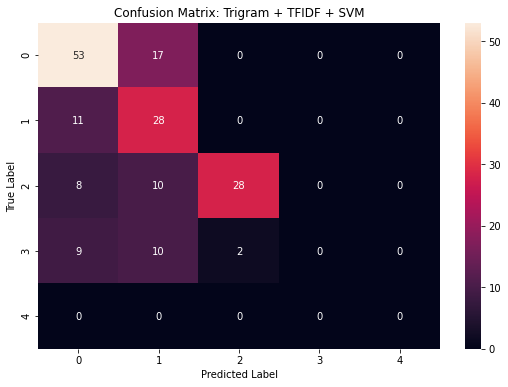

In [81]:
cm_func('Trigram + TFIDF + SVM',y_test, y_predict_svm)

In [82]:
svmvec = CountVectorizer(ngram_range=(3,3))
X_train_svm = svmvec.fit_transform(X_train)
X_test_svm = svmvec.transform(X_test)

clf_svm.fit(X_train_svm, y_train)
y_predict_svm = clf_svm.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

accuracy = 0.574, precision = 0.606, recall = 0.574, f1 = 0.559


Recall score: 0.57


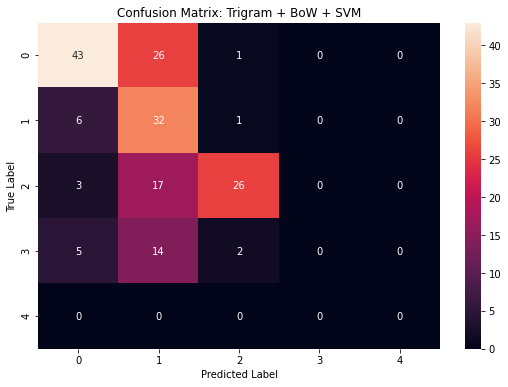

In [83]:
cm_func('Trigram + BoW + SVM',y_test, y_predict_svm)

Random Forest

RF + TF

In [117]:
clf = RandomForestClassifier()
clf.fit(X_train_svm, y_train)
y_predict_rf = clf.predict(X_test_svm)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.716, precision = 0.674, recall = 0.716, f1 = 0.681


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [129]:
tfvec = CountVectorizer()
X_train_rf = tfvec.fit_transform(X_train)
X_test_rf = tfvec.transform(X_test)

rfclf = RandomForestClassifier()
rfclf.fit(X_train_rf, y_train)
y_predict_rf = rfclf.predict(X_test_rf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.784, precision = 0.837, recall = 0.784, f1 = 0.751


In [130]:
tfvec = CountVectorizer(ngram_range=(2,2))
X_train_rf = tfvec.fit_transform(X_train)
X_test_rf = tfvec.transform(X_test)

rfclf = RandomForestClassifier()
rfclf.fit(X_train_rf, y_train)
y_predict_rf = rfclf.predict(X_test_rf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.773, precision = 0.826, recall = 0.773, f1 = 0.736


In [131]:
tfvec = CountVectorizer(ngram_range=(3,3))
X_train_rf = tfvec.fit_transform(X_train)
X_test_rf = tfvec.transform(X_test)

rfclf = RandomForestClassifier()
rfclf.fit(X_train_rf, y_train)
y_predict_rf = rfclf.predict(X_test_rf)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.716, precision = 0.674, recall = 0.716, f1 = 0.679


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [133]:
tfidfvec = TfidfVectorizer()
X_train_rfidf = tfidfvec.fit_transform(X_train)
X_test_rfidf = tfidfvec.transform(X_test)

rfclf.fit(X_train_rfidf, y_train)
y_predict_rfidf = rfclf.predict(X_test_rfidf)


accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.801, precision = 0.822, recall = 0.801, f1 = 0.790


In [134]:
tfidfvec = TfidfVectorizer(ngram_range=(2,2))
X_train_rfidf = tfidfvec.fit_transform(X_train)
X_test_rfidf = tfidfvec.transform(X_test)

rfclf.fit(X_train_rfidf, y_train)
y_predict_rfidf = rfclf.predict(X_test_rfidf)


accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.648, precision = 0.638, recall = 0.648, f1 = 0.616


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
tfidfvec = TfidfVectorizer(ngram_range=(3,3))
X_train_rfidf = tfidfvec.fit_transform(X_train)
X_test_rfidf = tfidfvec.transform(X_test)

rfclf.fit(X_train_rfidf, y_train)
y_predict_rfidf = rfclf.predict(X_test_rfidf)


accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_rfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.420, precision = 0.449, recall = 0.420, f1 = 0.400


C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Gradient Boosting Tree (GBT)

In [145]:
from sklearn.ensemble import GradientBoostingClassifier

tfvec = CountVectorizer()
X_train_gbt = tfvec.fit_transform(X_train)
X_test_gbt = tfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.989, precision = 0.989, recall = 0.989, f1 = 0.988


In [138]:
tfvec = CountVectorizer(ngram_range=(2,2))
X_train_gbt = tfvec.fit_transform(X_train)
X_test_gbt = tfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.989, precision = 0.989, recall = 0.989, f1 = 0.988


In [140]:
tfvec = CountVectorizer(ngram_range=(3,3))
X_train_gbt = tfvec.fit_transform(X_train)
X_test_gbt = tfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.989, precision = 0.989, recall = 0.989, f1 = 0.989


In [141]:
tfidfvec = TfidfVectorizer()
X_train_gbt = tfidfvec.fit_transform(X_train)
X_test_gbt = tfidfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.989, precision = 0.989, recall = 0.989, f1 = 0.988


In [143]:
tfidfvec = TfidfVectorizer(ngram_range=(2,2))
X_train_gbt = tfidfvec.fit_transform(X_train)
X_test_gbt = tfidfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.989, precision = 0.989, recall = 0.989, f1 = 0.988


In [144]:
tfidfvec = TfidfVectorizer(ngram_range=(3,3))
X_train_gbt = tfidfvec.fit_transform(X_train)
X_test_gbt = tfidfvec.transform(X_test)

gbtclf = GradientBoostingClassifier()
gbtclf.fit(X_train_gbt, y_train)
y_predict_gbt = gbtclf.predict(X_test_gbt)

accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predict_gbt)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, 
                                                                       recall_tfidf, f1_tfidf))

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


accuracy = 0.994, precision = 0.995, recall = 0.994, f1 = 0.994


### 4.5 Topic Modelling (LDA) <a class="anchor" id="lda"></a>

In [104]:
# Topic modelling
# unsupervised learning techniques to extract main topics that occur in a collection of documents. 
# each document represented by distribution of topics and each topic represented by distribution of words. 
# tokenize -> remove stopwords -> lemmatize -> convert to BoW

nltk.download('punkt')
nltk.download('wordnet')
from nltk import PorterStemmer
from nltk import WordNetLemmatizer
from nltk import word_tokenize

def preprocess_data(df):
    corpus=[]
    stem=PorterStemmer()
    lem=WordNetLemmatizer()
    for data in df['text_clean']:
        #words=[w for w in word_tokenize(data) if (w not in sw)]
        
        #words=[lem.lemmatize(w) for w in words if len(w)>2]
        
        corpus.append(data)
    
    return corpus

corpus=preprocess_data(df)

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\nxa07630\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\nxa07630\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [105]:
corpus

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['federal railroad administration new jersey avenue se washington dc primary cause code accident findings report derailment csx transportation incs unit crude oil train k transporting crude oil plains american mount carbon west virginia october accident summary feuary pm eastern standard time est eastbound csx transportation inc csxt train k transporting crude oil plains american operating csxt track derailed west mount carbon west virginia incident occurred csxt huntington division new river subdivision milepost caderailment occurred train traversed rail interl defect causing rail eak train k traveling speed mph mph maximum authorized speed segment train consisted two engines fully loaded tank cars carrying crude two covered hopper buffer cars total twentyseven tank cars derailed incident two tank cars punctured released crude oil ignited caught fire fire spread quickly resulting pool fire eventually led thermal tears thirteen additiol derailed tank cars ultimately twentyfour twentyse

In [85]:
from gensim import corpora, models

dic=corpora.Dictionary(corpus)
bow_corpus=[dic.doc2bow(doc) for doc in corpus]

In [86]:
# create LDA model

lda_model=models.LdaMulticore(bow_corpus,
                             num_topics=4,
                             id2word=dic,
                             passes=10,
                             workers=2)

lda_model.show_topics()

[(0,
  '0.040*"train" + 0.015*"railroad" + 0.014*"car" + 0.014*"track" + 0.012*"locomotive" + 0.011*"fra" + 0.011*"yes" + 0.009*"accident" + 0.009*"crew" + 0.007*"crossing"'),
 (1,
  '0.027*"train" + 0.018*"track" + 0.016*"car" + 0.015*"railroad" + 0.013*"rail" + 0.013*"fra" + 0.010*"derailment" + 0.009*"accident" + 0.008*"locomotive" + 0.008*"cause"'),
 (2,
  '0.031*"train" + 0.015*"track" + 0.012*"car" + 0.010*"sigl" + 0.010*"locomotive" + 0.009*"fra" + 0.008*"engineer" + 0.008*"crew" + 0.007*"railroad" + 0.007*"accident"'),
 (3,
  '0.030*"train" + 0.014*"railroad" + 0.013*"track" + 0.013*"crossing" + 0.013*"locomotive" + 0.011*"accident" + 0.009*"warning" + 0.008*"fra" + 0.008*"time" + 0.008*"crew"')]

- first word of all 4 topics -> 'train'
- track, railroad, locomotive, accident appear in all topics. 

In [87]:
import pyLDAvis
from pyLDAvis import gensim

pyLDAvis.enable_notebook()
vis=pyLDAvis.gensim.prepare(lda_model, bow_corpus, dic)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.055031 -0.002305       1        1  43.794149
1     -0.035544  0.041370       2        1  21.341901
3      0.009675 -0.063236       3        1  20.506249
2      0.080900  0.024171       4        1  14.357701, topic_info=            Term         Freq        Total Category  logprob  loglift
61    derailment  4830.000000  4830.000000  Default  30.0000  30.0000
217         rail  8199.000000  8199.000000  Default  29.0000  29.0000
254         sigl  7502.000000  7502.000000  Default  28.0000  28.0000
2864     warning  3864.000000  3864.000000  Default  27.0000  27.0000
648     crossing  9328.000000  9328.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
47       control   686.300034  7515.598399   Topic4  -5.6360  -0.4525
231       report   649.550048  6413.651189   Topic4  -5.6910  -0.3490
1197      number   540.835219  3455.852605   Topic4  -5.8742   0.0862
60      derailed   558.411538  4946.776695   Topic4  -5.8422  -0.2405
99       federal   542.517678  6093.410556   Topic4  -5.8711  -0.4779

[398 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
1          1  0.446878  accident
1          2  0.206467  accident
1          3  0.234794  accident
1          4  0.111860  accident
1830       1  0.133402    active
...      ...       ...       ...
1824       3  0.054405       yes
1824       4  0.010949       yes
29559      3  0.978047       ylt
29971      3  0.974344     yycpr
30409      2  0.936395  zlackcka

[829 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 4, 3])

Area of each circle represents importance of the topic relative to corpus. 4 circles = 4 topics.
Distance between centre of circles indicates similarity between topics. 
No overlap between topics, therefore not similar. 
Right side, histogram for each topic shows top 30 relevant words. 

### 4.6 Wordcloud <a class="anchor" id="wordcloud"></a>

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


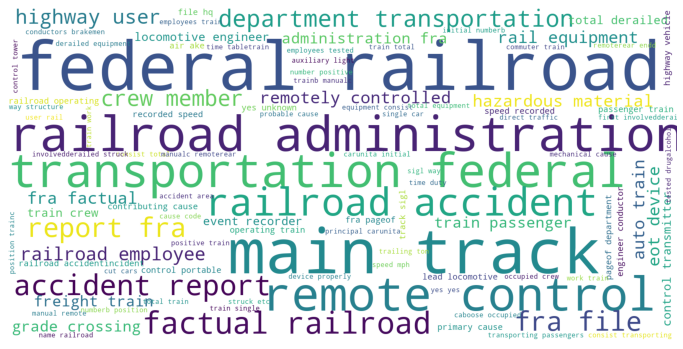

In [106]:
# Wordcloud
# frequency

from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data):
    wordcloud = WordCloud(background_color='white',
                         stopwords=stopwords,
                         max_words=100,
                         max_font_size=40,
                         scale=4,
                         random_state=1)
    
    wordcloud=wordcloud.generate(str(data))
    
    fig=plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    
    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(corpus)

Word cloud observations:
- 'main track', 'remote control', 'crew member', could it be potential features? 
- 'railroad', 'administration', 'accident', all investigation reports and also seen in word counts observe high word counts for these words. Will it be meaningful? 

### 4.7 Sentiment Analysis <a class="anchor" id="sentiment"></a>

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

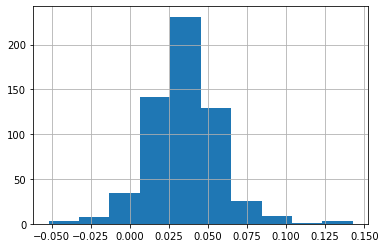

In [89]:
# Sentiment Analysis
# determine text is positive, negative or neutral
from textblob import TextBlob

def polarity(text):
    return TextBlob(text).sentiment.polarity

df['polarity_score'] = df[0].\
    apply(lambda x:polarity(x))

df['polarity_score'].hist()

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<BarContainer object of 2 artists>

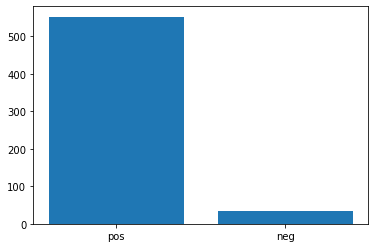

In [90]:
# majority between 0.025 and 0.05, relatively neutral
# classify by negative, positive and neutral to have another look

def sentiment(x):
    if x<0:
        return 'neg'
    elif x==0:
        return 'neu'
    else:
        return 'pos'
    
df['polarity'] = df['polarity_score'].\
    map(lambda x:sentiment(x))

plt.bar(df.polarity.value_counts().index,
       df.polarity.value_counts())

Majority documents positive?

In [91]:
df[df['polarity']=='pos'][0].head()

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0    FEDERAL RAILROAD ADMINISTRATION               ...
2     \n\nU.S. Department of  \nTransportation  \n ...
3    Federal Railroad Administration \nOffice of Ra...
4     \n\nFederal Railroad Administration \nOffice ...
5     \n\nFederal Railroad Administration \nOffice ...
Name: 0, dtype: object

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\nxa07630\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


<BarContainer object of 1 artists>

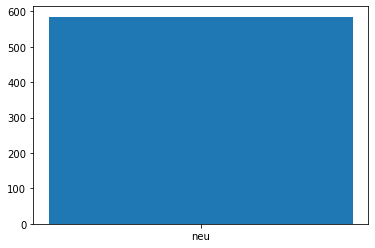

In [92]:
# VADER sentiment analysis
# works better in detecting negative sentiment. 

from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

def get_vader_score(sent):
    # Polarity score returns dictionary
    ss = sid.polarity_scores(sent)
    # return ss
    return np.argmax(list(ss.values())[:-1])

df['polarity'] = df[0].\
    map(lambda x: get_vader_score(x))

polarity=df['polarity'].replace({0:'neg',1:'neu',2:'pos'})

plt.bar(polarity.value_counts().index,
       polarity.value_counts())

TextBlob -> mostly positive
Vader -> all neutral

Sentiments analysis does not seem to provide valuable features since using textblob majority positive while using Vader majority neutral. 

### 4.8 Named Entity Recognition <a class="anchor" id="ner"></a>

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\spacy\util.py:275: UserWarning: [W031] Model 'en_core_web_sm' (2.2.0) requires spaCy v2.2 and is incompatible with the current spaCy version (2.3.5). This may lead to unexpected results or runtime errors. To resolve this, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


<AxesSubplot:>

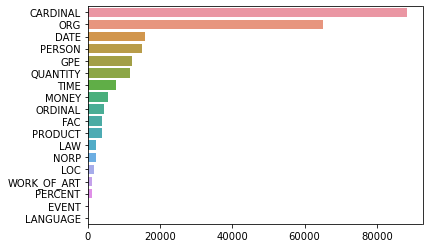

In [93]:
# NER - Named Entity Recognition

import spacy
import en_core_web_sm

nlp = en_core_web_sm.load()

def ner(text):
    doc=nlp(text)
    return [X.label_ for X in doc.ents]

ent=df[0].\
    apply(lambda x:ner(x))

ent=[x for sub in ent for x in sub]

counter=Counter(ent)
count=counter.most_common()

x,y=map(list,zip(*count))
sns.barplot(x=y,y=x)

In [94]:
egtxt = df['text_clean'].iloc[1]

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [95]:
from spacy import displacy

dis_ner = nlp(egtxt)

entities=[(i, i.label_, i.label) for i in dis_ner.ents]
entities

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(federal railroad administration, 'ORG', 383),
 (new jersey avenue, 'GPE', 384),
 (washington, 'GPE', 384),
 (csx transportation incs unit, 'ORG', 383),
 (american, 'NORP', 381),
 (west virginia, 'GPE', 384),
 (november, 'DATE', 391),
 (ii hazardous materials information, 'ORG', 383),
 (sperrys interl, 'ORG', 383),
 (g esi, 'PERSON', 380),
 (feuary pm, 'PERSON', 380),
 (csx transportation inc, 'ORG', 383),
 (american, 'NORP', 381),
 (west mount, 'LOC', 385),
 (west virginia, 'LOC', 385),
 (csxt huntington, 'ORG', 383),
 (new river, 'LOC', 385),
 (mph mph, 'PERSON', 380),
 (two, 'CARDINAL', 397),
 (two, 'CARDINAL', 397),
 (hopper buffer, 'PERSON', 380),
 (two, 'CARDINAL', 397),
 (one, 'CARDINAL', 397),
 (one, 'CARDINAL', 397),
 (one, 'CARDINAL', 397),
 (pm minutes, 'TIME', 392),
 (west virginia, 'GPE', 384),
 (first, 'ORDINAL', 396),
 (fourday, 'DATE', 391),
 (approximately one hour, 'TIME', 392),
 (west virginia, 'GPE', 384),
 (american, 'NORP', 381),
 (montgomery west virginia, 'LOC'

In [96]:
egtxt2 = df[0].iloc[1]

dis_ner2 = nlp(egtxt2)

entities=[(i, i.label_, i.label) for i in dis_ner2.ents]
entities

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(FEDERAL RAILROAD ADMINISTRATION, 'ORG', 383),
 (1200, 'CARDINAL', 397),
 (New Jersey, 'GPE', 384),
 (Washington, DC, 'GPE', 384),
 (CSX Transportation,, 'ORG', 383),
 (West Virginia, 'GPE', 384),
 (November 4, 2015
   
  ,
  'DATE',
  391),
 (1, 'CARDINAL', 397),
 (2, 'CARDINAL', 397),
 (2, 'CARDINAL', 397),
 (3, 'CARDINAL', 397),
 (3, 'CARDINAL', 397),
 (CSXT, 'ORG', 383),
 (3, 'CARDINAL', 397),
 (Sperry, 'ORG', 383),
 (3, 'CARDINAL', 397),
 (4, 'CARDINAL', 397),
 (4, 'CARDINAL', 397),
 (5, 'CARDINAL', 397),
 (6, 'CARDINAL', 397),
 (6, 'CARDINAL', 397),
 (6, 'CARDINAL', 397),
 (7, 'CARDINAL', 397),
 (Reopening, 'PERSON', 380),
 (8 
  
  FRA,
  'TIME',
  392),
 (9, 'CARDINAL', 397),
 (9, 'CARDINAL', 397),
 (11, 'CARDINAL', 397),
 (11, 'CARDINAL', 397),
 (13, 'CARDINAL', 397),
 (14, 'CARDINAL', 397),
 (14, 'CARDINAL', 397),
 (15, 'CARDINAL', 397),
 (15, 'CARDINAL', 397),
 (16, 'CARDINAL', 397),
 (16, 'CARDINAL', 397),
 (16, 'CARDINAL', 397),
 (17, 'CARDINAL', 397),
 (18 
  
   
  ,
  

NER does not work well with text that has undergone preprocessing. 

Example,
- 'mph mph' is recognized as a 'PERSON' rather than a 'QUANTITY'. Numerical values was removed as part of data preprocessing. 
- 'hopper buffer' is referring to physical item used in railroad but is recognized as a 'PERSON'.

There are less recognization mistakes when using text that did not undergo preprocessing. However errors are still present. 

Example,
- 'CSXT Train' recognized as a 'PERSON' rather than 'ORG'.
- 'Plains All American', recognized as a 'PERSON' rather than 'ORG'.

### 4.9 PoS Tagging <a class="anchor" id="pos"></a>

C:\Users\nxa07630\AppData\Local\Continuum\anaconda2\envs\finalproject\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

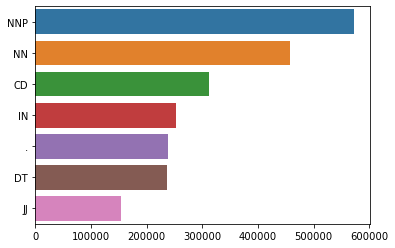

In [97]:
# POS tagging

def pos(text):
    pos=nltk.pos_tag(word_tokenize(text))
    pos=list(map(list,zip(*pos)))[1]
    return pos

tags=df[0].apply(lambda x: pos(x))
tags=[x for l in tags for x in l]
counter=Counter(tags)

x,y=list(map(list,zip(*counter.most_common(7))))
sns.barplot(x=y,y=x)